In [26]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder

In [7]:
df = pd.read_csv('/content/2018.csv')

In [10]:
new_df = df.copy()

df2023 = new_df[new_df['Year'] == 2023]
len(df2023.index)
#So far in 2023, there has been 61,254 crimes committed

61254

In [11]:
df2022 = new_df[new_df['Year'] == 2022]
len(df2022.index)
#In 2022, there has been 237,880 crimes committed


237880

In [12]:
df2021 = new_df[new_df['Year'] == 2021]
len(df2021.index)
#In 2021, there has been 208,539 crimes committed

208539

In [16]:
df2020 = new_df[new_df['Year'] == 2020]
len(df2020.index)
#In 2020, there has been 212,076 crimes committed

28132

In [ ]:
df2019 = new_df[new_df['Year'] == 2019]
len(df2019.index)
#In 2019, there has been 261,237 crimes committed

In [ ]:
df2018 = new_df[new_df['Year'] == 2018]
print(len(df2018.index))
#In 2018, there has been 268,767 crimes committed

In [19]:
df['Date'] = pd.to_datetime(df['Date'])

df['Hour'] = df['Date'].dt.hour.apply(lambda x: '{:02d}'.format(x))
df['Hour'] = df['Hour'] + ':00'

df['Time'] = df['Hour'].str[:2].astype(int)

In [ ]:
#Line chart showing number of crimes per year
import matplotlib.pyplot as plt
year = ['2018', '2019', '2020', '2021', '2022']
crime = [len(df2018), len(df2019), len(df2020), len(df2021), len(df2022)]
plt.plot(year, crime)
plt.title("Crimes per Year (2018-2022)")
plt.xlabel("Year")
plt.ylabel("Crimes per Year")
plt.show()

In [ ]:
# 2018-2023 Responses for Primary Type
value_counts = new_df['Primary Type'].value_counts()
crimes = pd.DataFrame(value_counts)
print(value_counts)
type(value_counts)

In [ ]:
plt.plot(crimes)
plt

In [ ]:
crimes.plot.pie(y='Primary Type', figsize=(8, 8), autopct='%1.1f%%', startangle=90)
plt.legend().remove()
plt.title('Crime Types')
plt.show()

In [20]:
import folium
from folium.plugins import HeatMap

df = df.dropna(subset=['Latitude', 'Longitude'])

crime_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=11)
HeatMap(data=df[['Latitude', 'Longitude']], radius=10).add_to(crime_map)

crime_map



In [36]:
df1 = df1.dropna()
df1['Arrest'] = df1['Arrest'].astype(int)

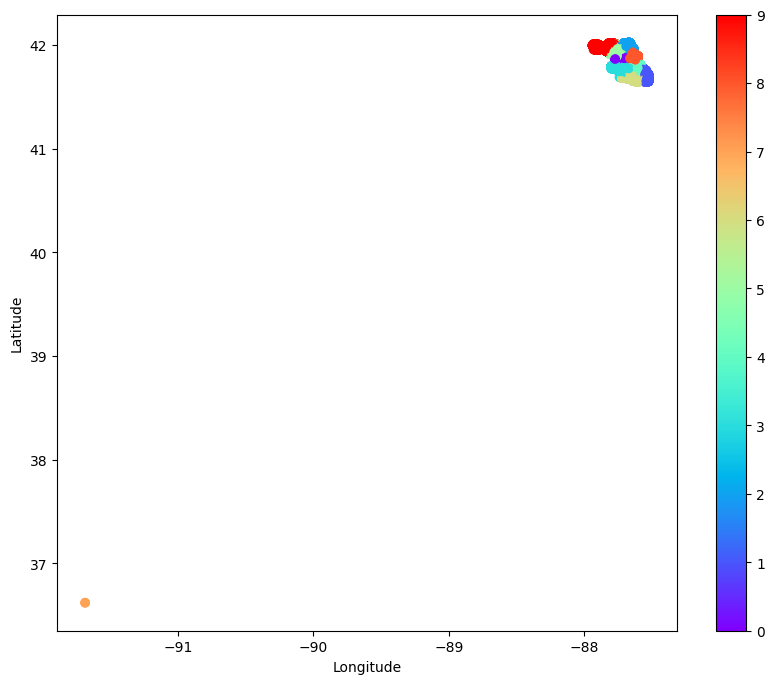

Cluster Crime Counts:
0    83667
1    55402
2    60562
3    49995
4    76076
5    49914
6    51435
7        2
8    86652
9    10460
dtype: int64

Cluster Coordinates:
   Longitude   Latitude
0  41.878088 -87.720437
1  41.743491 -87.575428
2  41.972534 -87.674633
3  41.783957 -87.704172
4  41.787476 -87.627524
5  41.932304 -87.751921
6  41.705863 -87.639470
7  36.619446 -91.686566
8  41.884499 -87.642516
9  41.973534 -87.831350


In [21]:
df1 = df.copy()

df2 = df1[['Latitude', 'Longitude']]
df2 = df2.dropna()
num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(df2)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
cluster_df = pd.DataFrame({'Latitude': df2['Latitude'], 'Longitude': df2['Longitude'], 'Labels': labels})
cluster_df = cluster_df.dropna()
fig, ax = plt.subplots(figsize=(10, 8))
scatter = ax.scatter(cluster_df['Longitude'], cluster_df['Latitude'], c=cluster_df['Labels'], cmap='rainbow')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.colorbar(scatter)
plt.show()
crime_counts = pd.Series(labels).value_counts().sort_index()

cluster_coords = pd.DataFrame(centroids, columns=['Longitude', 'Latitude'])

print("Cluster Crime Counts:")
print(crime_counts)
print("\nCluster Coordinates:")
print(cluster_coords)


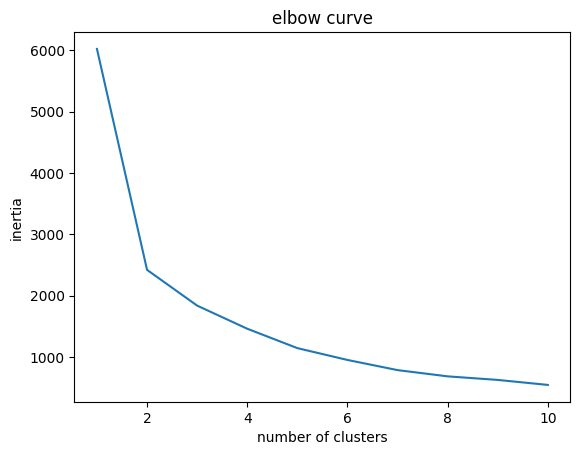

In [22]:

inertia = []
k_values = range(1,11)

for k in k_values:
    kmeans = KMeans(n_clusters = k, random_state = 42)
    kmeans.fit(df2)
    inertia.append(kmeans.inertia_)

plt.plot(k_values,inertia)
plt.xlabel('number of clusters')
plt.ylabel('inertia')
plt.title('elbow curve')
plt.show()


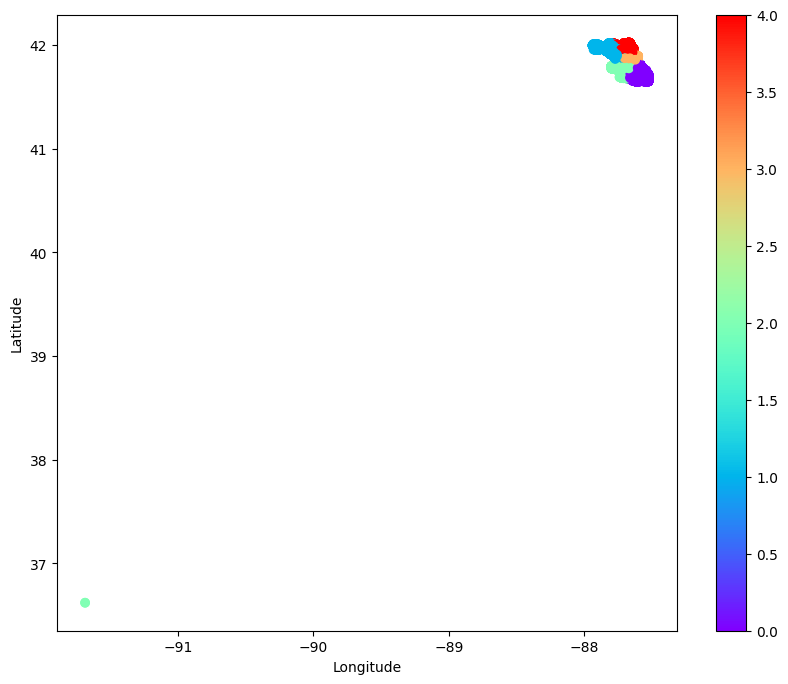

Cluster Crime Counts:
0    138610
1    120106
2     82463
3    111937
4     71049
dtype: int64

Cluster Coordinates:
   Longitude   Latitude
0  41.741448 -87.604489
1  41.905348 -87.746568
2  41.776910 -87.686934
3  41.874370 -87.646712
4  41.968745 -87.678686


In [24]:
num_clusters1 = 5

kmeans1 = KMeans(n_clusters=num_clusters1, random_state=42)
kmeans1.fit(df2)
labels1 = kmeans1.labels_
centroids1 = kmeans1.cluster_centers_

cluster_df1 = pd.DataFrame({'Latitude': df2['Latitude'], 'Longitude': df2['Longitude'], 'Labels': labels1})

cluster_df1 = cluster_df1.dropna()

fig, ax = plt.subplots(figsize=(10, 8))
scatter = ax.scatter(cluster_df1['Longitude'], cluster_df1['Latitude'], c=cluster_df1['Labels'], cmap='rainbow')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.colorbar(scatter)
plt.show()

crime_counts1 = pd.Series(labels).value_counts().sort_index()

cluster_coords1 = pd.DataFrame(centroids1, columns=['Longitude', 'Latitude'])

print("Cluster Crime Counts:")
print(crime_counts1)
print("\nCluster Coordinates:")
print(cluster_coords1)



In [ ]:
df2022x = df2022[['District', 'Arrest']]

from sklearn.cluster import DBSCAN
epsilon = 0.1
min_sample = 5
dbscan = DBSCAN(eps = epsilon, min_samples = min_sample)
clusters = dbscan.fit_predict(df2022x)

df2022x['Cluster'] = clusters

plt.scatter(df2022x['District'], df2022x['Arrest'], c = df2022x['Cluster'])
plt.xlabel('District')
plt.ylabel('Arrest')
plt.title('District vs Arrest of chicago crimes using DBSCAN clustering')
plt.legend()
plt.show()

In [ ]:
df2021x = df2021[['District', 'Arrest']]

from sklearn.cluster import DBSCAN
epsilon = 0.1
min_sample = 5
dbscan = DBSCAN(eps = epsilon, min_samples = min_sample)
clusters = dbscan.fit_predict(df2021x)

df2021x['Cluster'] = clusters

plt.scatter(df2021x['District'], df2021x['Arrest'], c = df2021x['Cluster'])
plt.xlabel('District')
plt.ylabel('Arrest')
plt.title('District vs Arrest of chicago crimes using DBSCAN clustering')
plt.legend()
plt.show()


In [38]:
df3 = df1.copy()

le = LabelEncoder()
df3['Primary Type1'] = le.fit_transform(df3['Primary Type'])
X = df3[['Primary Type1']]
y = df3['Arrest']
df3 = df3.dropna()
dfnew = pd.DataFrame(df3['Primary Type'], df3['Primary Type1'])
print(dfnew)



                  Primary Type
Primary Type1                 
17                     ROBBERY
2              CRIMINAL DAMAGE
5                      ASSAULT
30                     BATTERY
30                     BATTERY
...                        ...
2              CRIMINAL DAMAGE
16                    BURGLARY
30                     BATTERY
5                      ASSAULT
30                     BATTERY

[519904 rows x 1 columns]


In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))

Accuracy: 0.9123240068730285
Confusion Matrix:
 [[134752   2505]
 [ 11170   7545]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95    137257
           1       0.75      0.40      0.52     18715

    accuracy                           0.91    155972
   macro avg       0.84      0.69      0.74    155972
weighted avg       0.90      0.91      0.90    155972



In [47]:
crime_type = 17
prediction = clf.predict([[crime_type]])
print(f"Predicted arrest for crime type '{crime_type}': {prediction[0]}")

Predicted arrest for crime type '17': 1


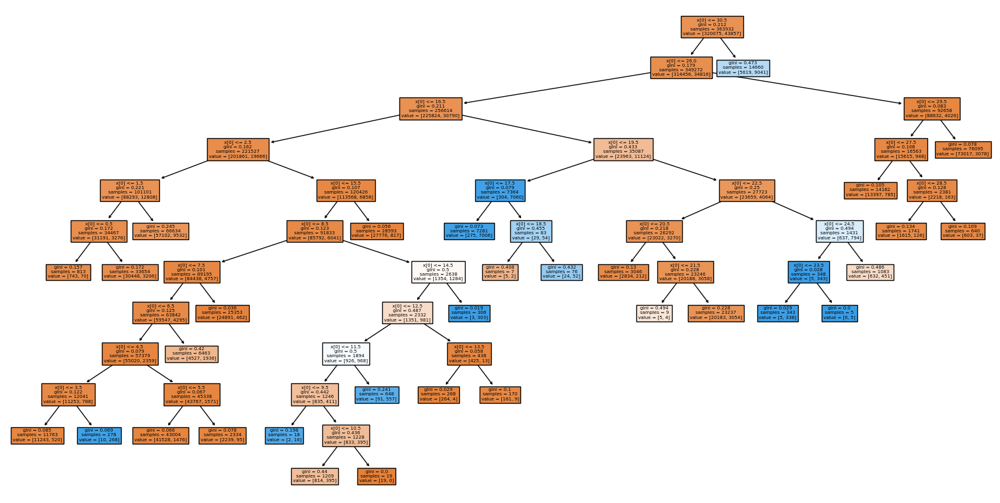

In [41]:
plt.figure(figsize=(20,10))
plot_tree(clf, filled=True)
plt.show()


In [43]:
df5 = df1.copy()
X5 = df5[['District']]
y5 = df5['Primary Type']

X_train5, X_test5, y_train5, y_test5 = train_test_split(X5, y5, test_size=0.2, random_state=42)
model5 = LogisticRegression(max_iter=10000)
model5.fit(X_train5, y_train5)
y_pred5 = model5.predict(X_test5)
accuracy5 = accuracy_score(y_test5, y_pred5)
confusion_mat5 = confusion_matrix(y_test5, y_pred5)
print(f"Accuracy: {accuracy5}")
print(f"Confusion Matrix:\n{confusion_mat5}")

Accuracy: 0.2139814004481588
Confusion Matrix:
[[    0     0    68     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0   152     0]
 [    0     0  3336     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0  6239     0]
 [    0     0  6306     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0 12788     0]
 [    0     0  1006     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0  2333     0]
 [    0     0    17     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0  

In [48]:
X1= df5[['District']]
y1 = df5['Primary Type']

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.3, random_state=42)

clf1 = DecisionTreeClassifier()

clf1.fit(X_train1, y_train1)

y_pred1 = clf1.predict(X_test1)

print('Accuracy:', accuracy_score(y_test1, y_pred1))
print('Confusion Matrix:\n', confusion_matrix(y_test1, y_pred1))
print('Classification Report:\n', classification_report(y_test1, y_pred1))

Accuracy: 0.2438194034826764
Confusion Matrix:
 [[    0     0   190 ...     0   127     0]
 [    0     0  7607 ...     0  6771     0]
 [    0     0 14900 ...     0 13692     0]
 ...
 [    0     0   113 ...     0   163     0]
 [    0     0  9860 ...     0 23129     0]
 [    0     0  4280 ...     0  2057     0]]
Classification Report:
                                    precision    recall  f1-score   support

                            ARSON       0.00      0.00      0.00       317
                          ASSAULT       0.00      0.00      0.00     14378
                          BATTERY       0.21      0.52      0.30     28592
                         BURGLARY       0.00      0.00      0.00      5071
CONCEALED CARRY LICENSE VIOLATION       0.00      0.00      0.00       131
                  CRIMINAL DAMAGE       0.00      0.00      0.00     18399
          CRIMINAL SEXUAL ASSAULT       0.00      0.00      0.00      1009
                CRIMINAL TRESPASS       0.00      0.00      0.0

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
df5 = df1.copy()

X = df5[['Time']]
y = df5['Arrest']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = DecisionTreeClassifier()

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))


Accuracy: 0.880010514707768
Confusion Matrix:
 [[137257      0]
 [ 18715      0]]
Classification Report:
               precision    recall  f1-score   support

           0       0.88      1.00      0.94    137257
           1       0.00      0.00      0.00     18715

    accuracy                           0.88    155972
   macro avg       0.44      0.50      0.47    155972
weighted avg       0.77      0.88      0.82    155972



In [51]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)

correlation = np.corrcoef(y_pred_lr, y_test)


print('Correlation Coefficient:', correlation[1,1])


Correlation Coefficient: 1.0


In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
X = df1[['Time']]
y = df1['Arrest']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

undersampler = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train, y_train)

model = LogisticRegression(max_iter=10000)
model.fit(X_train_resampled, y_train_resampled)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion_mat}")


In [ ]:
from imblearn.over_sampling import RandomOverSampler

X = df1[['Time']]
y = df1['Arrest']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

oversampler = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train, y_train)

model = LogisticRegression(max_iter=10000)
model.fit(X_train_resampled, y_train_resampled)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{confusion_mat}")
